# 📊 Exploratory Data Analysis (EDA)

**Project:** Student Performance, Gaming Habits, and Mental Health Analysis  
**Objective:** To explore distributions, correlations, and relationships between variables in the datasets.  
**Target Variable:** `final_cgpa` (common across all datasets)

---

### 📑 Table of Contents
1. Data Loading and Overview
2. Distribution Analyses (Histograms)
3. Correlation Heatmaps
4. Boxplots (Boxplots)
5. Scatterplots
6. Pairplot Analysis
7. Categorical Boxplots
8. Correlation Summaries
9. Summary Visualization
10. Key Findings

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os

warnings.filterwarnings('ignore')

# ─── Visual Style Settings ───
sns.set_theme(style="whitegrid", palette="muted", font_scale=1.1)
plt.rcParams.update({
    'figure.dpi': 150,
    'savefig.dpi': 150,
    'figure.facecolor': 'white',
    'axes.facecolor': '#FAFAFA',
    'font.family': 'sans-serif',
    'axes.titlesize': 14,
    'axes.labelsize': 12,
})

FIGURES_DIR = os.path.join('..', 'outputs', 'figures')
os.makedirs(FIGURES_DIR, exist_ok=True)

def save_fig(fig, name):
    """Save the figure to outputs/figures folder."""
    path = os.path.join(FIGURES_DIR, name)
    fig.savefig(path, bbox_inches='tight', facecolor='white')
    print(f"✅ Kaydedildi: {path}")

print("📦 Libraries loaded successfully.")

📦 Libraries loaded successfully.


## 1. Data Loading and Overview

Three datasets are used:
- **Gaming**: Gaming habits and academic performance (8001 rows, 24 columns)
- **Student**: Student lifestyle habits and academic performance (5001 rows, 16 columns)
- **Mental**: Mental health indicators and academic performance (101 rows, 17 columns)

In [2]:
# ─── Load Datasets ───
student_df = pd.read_csv('../data/processed/final_student_features.csv')
gaming_df  = pd.read_csv('../data/processed/final_gaming_features.csv')
mental_df  = pd.read_csv('../data/processed/final_mental_features.csv')

datasets = {
    'Student': student_df,
    'Gaming': gaming_df,
    'Mental': mental_df
}

for name, df in datasets.items():
    print(f"\n{'='*65}")
    print(f"📋 {name} Dataset")
    print(f"{'='*65}")
    print(f"   Number of rows : {df.shape[0]:,}")
    print(f"   Number of columns : {df.shape[1]}")
    print(f"   Columns     : {list(df.columns)}")
    print(f"   Missing values  : {df.isnull().sum().sum()}")
    print(f"   Memory       : {df.memory_usage(deep=True).sum() / 1024:.1f} KB")


📋 Student Dataset
   Number of rows : 5,000
   Number of columns : 16
   Columns     : ['student_id', 'gender', 'age', 'major', 'attendance', 'study_hours_per_day', 'previous_cgpa', 'sleep_hours_per_day', 'social_hours_week', 'final_cgpa', 'is_female', 'is_male', 'is_other', 'source', 'study_efficiency', 'attendance_impact']
   Missing values  : 0
   Memory       : 1385.8 KB

📋 Gaming Dataset
   Number of rows : 8,000
   Number of columns : 24
   Columns     : ['student_id', 'age', 'gender', 'gaming_hours', 'study_hours_per_day', 'sleep_hours_per_day', 'attendance', 'gaming_genre', 'social_hours_day', 'device_usage', 'reaction_time_ms', 'addiction_score', 'stress_level', 'grades', 'is_female', 'is_male', 'is_other', 'social_hours_week', 'final_cgpa', 'source', 'gaming_intensity', 'academic_pressure_index', 'sleep_gaming_balance', 'total_screen_time']
   Missing values  : 0
   Memory       : 2980.5 KB

📋 Mental Dataset
   Number of rows : 100
   Number of columns : 17
   Columns     : 

### 1.1 Descriptive Statistics

In [3]:
for name, df in datasets.items():
    print(f"\n{'='*65}")
    print(f"📊 {name} — Descriptive Statistics")
    print(f"{'='*65}")
    display(df.describe().round(3))


📊 Student — Descriptive Statistics


,gender,age,attendance,study_hours_per_day,previous_cgpa,sleep_hours_per_day,social_hours_week,final_cgpa,is_female,is_male,is_other,study_efficiency,attendance_impact
count,5000.000,5000.000,5000.000,5000.000,5000.000,5000.000,5000.000,5000.000,5000.000,5000.000,5000.0,5000.000,5000.000
mean,0.550,20.949,83.796,4.518,3.094,7.012,8.006,3.272,0.450,0.550,0.0,2.181,2.594
std,0.498,2.017,12.868,2.568,0.477,1.424,2.798,0.508,0.498,0.498,0.0,1.318,0.573
min,0.000,18.000,26.200,0.100,1.350,4.000,0.000,1.160,0.000,0.000,0.0,0.050,0.841
25%,0.000,19.000,75.100,2.600,2.760,6.000,6.000,2.920,0.000,0.000,0.0,1.200,2.185
50%,1.000,21.000,85.050,4.000,3.100,7.000,8.000,3.310,0.000,1.000,0.0,1.897,2.585
75%,1.000,23.000,94.800,6.000,3.430,8.000,10.000,3.680,1.000,1.000,0.0,2.864,3.010
max,1.000,24.000,100.000,14.000,4.000,10.000,20.000,4.000,1.000,1.000,0.0,9.489,4.000



📊 Gaming — Descriptive Statistics


,age,gender,gaming_hours,study_hours_per_day,sleep_hours_per_day,attendance,social_hours_day,device_usage,reaction_time_ms,addiction_score,grades,is_female,is_male,is_other,social_hours_week,final_cgpa,gaming_intensity,academic_pressure_index,sleep_gaming_balance,total_screen_time
count,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000,8000.000
mean,19.984,0.561,4.086,5.461,6.493,79.887,2.508,7.586,271.106,9.908,66.181,0.475,0.488,0.037,17.555,2.647,0.170,1.479,1.751,6.594
std,2.587,0.565,2.309,2.576,1.443,11.580,1.441,2.710,29.441,5.036,22.422,0.499,0.500,0.188,10.088,0.897,0.096,1.345,1.315,2.730
min,16.000,0.000,0.000,1.000,4.000,60.000,0.000,1.100,183.260,-4.510,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.114,0.449,0.130
25%,18.000,0.000,2.130,3.240,5.240,69.780,1.288,5.560,247.160,5.920,49.880,0.000,0.000,0.000,9.012,2.000,0.089,0.620,0.917,4.530
50%,20.000,1.000,4.130,5.460,6.505,79.695,2.500,7.610,270.475,10.005,67.070,0.000,0.000,0.000,17.500,2.680,0.172,1.063,1.270,6.625
75%,22.000,1.000,6.060,7.660,7.730,90.100,3.760,9.600,294.690,13.860,83.992,1.000,1.000,0.000,26.320,3.360,0.252,1.799,2.105,8.650
max,24.000,2.000,8.000,10.000,9.000,100.000,5.000,13.950,347.870,23.160,118.633,1.000,1.000,1.000,35.000,4.750,0.333,9.330,8.920,12.960



📊 Mental — Descriptive Statistics


,gender,age,year_of_study,marital_status,depression,anxiety,panic_attack,seek_treatment,is_female,is_male,is_other,final_cgpa,total_mental_risk
count,100.000,100.000,100.000,100.000,100.000,100.000,100.000,100.000,100.000,100.000,100.0,100.000,100.000
mean,0.250,20.530,1.980,0.160,0.350,0.340,0.330,0.060,0.750,0.250,0.0,3.380,1.020
std,0.435,2.496,0.995,0.368,0.479,0.476,0.473,0.239,0.435,0.435,0.0,0.538,0.974
min,0.000,18.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.995,0.000
25%,0.000,18.000,1.000,0.000,0.000,0.000,0.000,0.000,0.750,0.000,0.0,3.245,0.000
50%,0.000,19.000,2.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.0,3.245,1.000
75%,0.250,23.000,3.000,0.000,1.000,1.000,1.000,0.000,1.000,0.250,0.0,3.750,2.000
max,1.000,24.000,4.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.0,3.750,3.000


### 1.2 Data Types and First Rows

In [4]:
for name, df in datasets.items():
    print(f"\n{'='*65}")
    print(f"🔍 {name} — First 5 Rows")
    print(f"{'='*65}")
    display(df.head())
    print(f"\n📐 Data Types:")
    display(df.dtypes)


🔍 Student — First 5 Rows


,student_id,gender,age,major,attendance,study_hours_per_day,previous_cgpa,sleep_hours_per_day,social_hours_week,final_cgpa,is_female,is_male,is_other,source,study_efficiency,attendance_impact
0,student_ID00001,1,20,Engineering,83.9,4.4,2.65,9.1,8,2.78,0,1,0,student,2.053333,2.22335
1,student_ID00002,0,24,Business,80.7,4.0,3.58,4.0,4,3.76,1,0,0,student,2.545455,2.88906
2,student_ID00003,0,20,Mathematics,91.5,3.9,3.29,6.7,4,3.75,1,0,0,student,2.481818,3.01035
3,student_ID00004,0,23,Engineering,73.9,8.8,3.48,4.0,6,3.69,1,0,0,student,4.738462,2.57172
4,student_ID00005,1,21,Economics,79.8,2.2,2.66,8.7,6,2.34,0,1,0,student,1.184615,2.12268



📐 Data Types:


student_id                 str
gender                   int64
age                      int64
major                      str
attendance             float64
study_hours_per_day    float64
previous_cgpa          float64
sleep_hours_per_day    float64
social_hours_week        int64
final_cgpa             float64
is_female                int64
is_male                  int64
is_other                 int64
source                     str
study_efficiency       float64
attendance_impact      float64
dtype: object


🔍 Gaming — First 5 Rows


,student_id,age,gender,gaming_hours,study_hours_per_day,sleep_hours_per_day,attendance,gaming_genre,social_hours_day,device_usage,...,is_female,is_male,is_other,social_hours_week,final_cgpa,source,gaming_intensity,academic_pressure_index,sleep_gaming_balance,total_screen_time
0,gaming_1,22,1,7.23,8.78,6.96,91.44,FPS,3.25,9.36,...,0,1,0,22.75,3.46,gaming,0.301250,1.066829,0.845687,10.48
1,gaming_2,19,1,0.07,8.72,7.63,63.63,Casual,1.02,3.21,...,0,1,0,7.14,3.93,gaming,0.002917,8.149533,7.130841,1.09
2,gaming_3,23,0,1.73,9.56,4.40,83.26,Casual,3.46,5.56,...,1,0,0,24.22,3.62,gaming,0.072083,3.501832,1.611722,5.19
3,gaming_4,20,0,6.62,1.68,7.83,75.04,RPG,1.46,11.78,...,1,0,0,10.22,1.31,gaming,0.275833,0.220472,1.027559,8.08
4,gaming_5,22,0,5.36,5.83,5.55,65.57,FPS,1.01,8.23,...,1,0,0,7.07,2.35,gaming,0.223333,0.916667,0.872642,6.37



📐 Data Types:


student_id                     str
age                          int64
gender                       int64
gaming_hours               float64
study_hours_per_day        float64
sleep_hours_per_day        float64
attendance                 float64
gaming_genre                   str
social_hours_day           float64
device_usage               float64
reaction_time_ms           float64
addiction_score            float64
stress_level                   str
grades                     float64
is_female                    int64
is_male                      int64
is_other                     int64
social_hours_week          float64
final_cgpa                 float64
source                         str
gaming_intensity           float64
academic_pressure_index    float64
sleep_gaming_balance       float64
total_screen_time          float64
dtype: object


🔍 Mental — First 5 Rows


,gender,age,course,year_of_study,cgpa_range,marital_status,depression,anxiety,panic_attack,seek_treatment,is_female,is_male,is_other,final_cgpa,student_id,source,total_mental_risk
0,0,18,Engineering,1,"[3.0, 3.49]",0,1,0,1,0,1,0,0,3.245,mental_0,mental,2
1,1,21,Islamic education,2,"[3.0, 3.49]",0,0,1,0,0,0,1,0,3.245,mental_1,mental,1
2,1,19,BIT,1,"[3.0, 3.49]",0,1,1,1,0,0,1,0,3.245,mental_2,mental,3
3,0,22,Laws,3,"[3.0, 3.49]",1,1,0,0,0,1,0,0,3.245,mental_3,mental,1
4,1,23,Mathemathics,4,"[3.0, 3.49]",0,0,0,0,0,0,1,0,3.245,mental_4,mental,0



📐 Data Types:


gender                 int64
age                    int64
course                   str
year_of_study          int64
cgpa_range               str
marital_status         int64
depression             int64
anxiety                int64
panic_attack           int64
seek_treatment         int64
is_female              int64
is_male                int64
is_other               int64
final_cgpa           float64
student_id               str
source                   str
total_mental_risk      int64
dtype: object

## 2. Distribution Analyses (Histograms)

We analyze the distributions of numerical variables for each dataset using **histogram + KDE (Kernel Density Estimation)** plots.  
The red dashed line indicates the mean.

✅ Kaydedildi: ..\outputs\figures\histogram_student.png


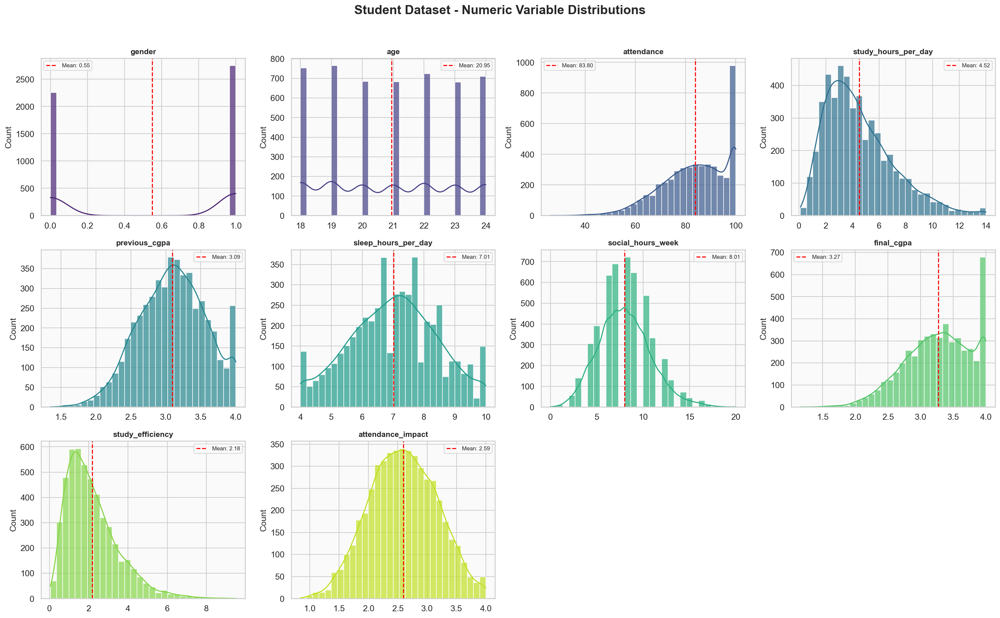

In [5]:
# ─── Student Dataset Histograms ───
# Columns to be excluded from analysis
exclude_cols = ['student_id', 'source', 'is_female', 'is_male', 'is_other']
student_numeric = [c for c in student_df.select_dtypes(include=[np.number]).columns if c not in exclude_cols]

n_cols = 4
n_rows = (len(student_numeric) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
fig.suptitle('Student Dataset - Numeric Variable Distributions',
             fontsize=18, fontweight='bold', y=1.02)

colors = sns.color_palette("viridis", len(student_numeric))

for i, col in enumerate(student_numeric):
    ax = axes.flatten()[i]
    sns.histplot(student_df[col], kde=True, ax=ax, color=colors[i],
                 edgecolor='white', alpha=0.7, bins=30)
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_xlabel('')
    mean_val = student_df[col].mean()
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.5,
               label=f'Mean: {mean_val:.2f}')
    ax.legend(fontsize=8)

for j in range(i + 1, n_rows * n_cols):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'histogram_student.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\histogram_gaming.png


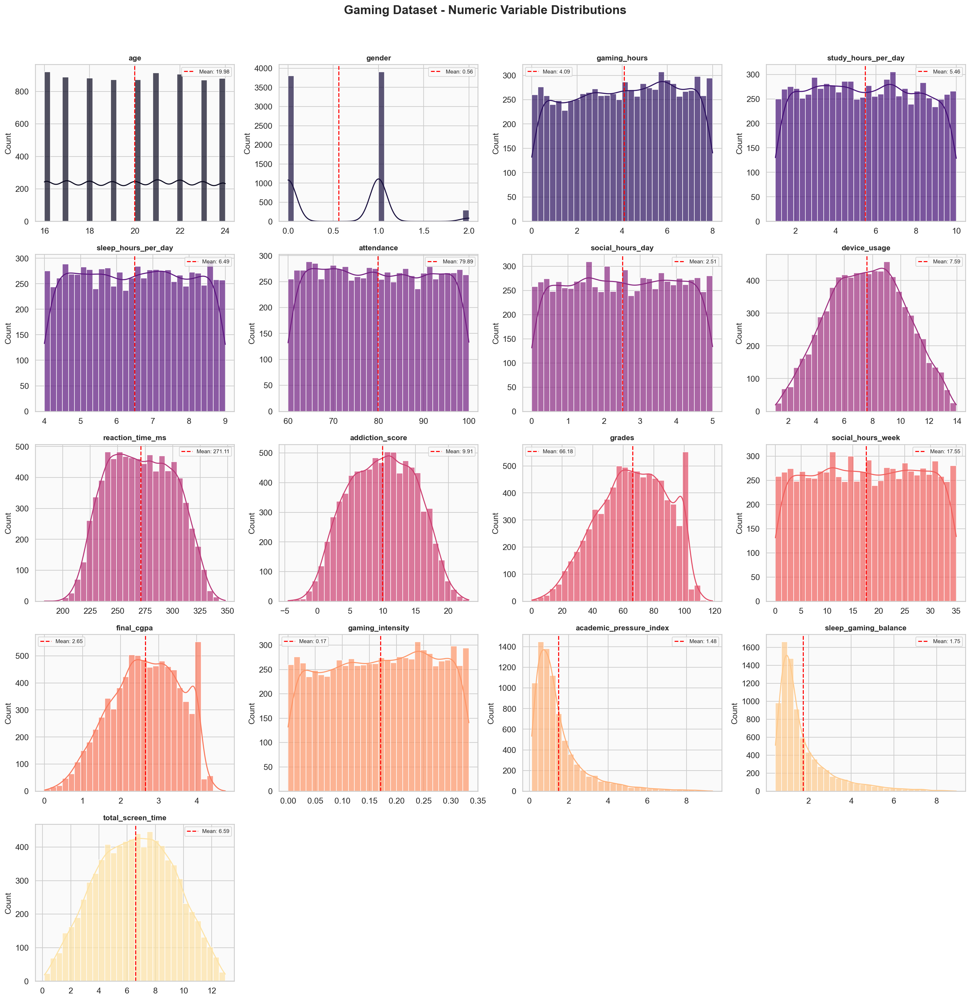

In [6]:
# ─── Gaming Dataset Histograms ───
exclude_cols = ['student_id', 'source', 'is_female', 'is_male', 'is_other']
gaming_numeric = [c for c in gaming_df.select_dtypes(include=[np.number]).columns if c not in exclude_cols]

n_cols = 4
n_rows = (len(gaming_numeric) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
fig.suptitle('Gaming Dataset - Numeric Variable Distributions',
             fontsize=18, fontweight='bold', y=1.02)

colors = sns.color_palette("magma", len(gaming_numeric))

for i, col in enumerate(gaming_numeric):
    ax = axes.flatten()[i]
    sns.histplot(gaming_df[col], kde=True, ax=ax, color=colors[i],
                 edgecolor='white', alpha=0.7, bins=30)
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_xlabel('')
    mean_val = gaming_df[col].mean()
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.5,
               label=f'Mean: {mean_val:.2f}')
    ax.legend(fontsize=8)

for j in range(i + 1, n_rows * n_cols):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'histogram_gaming.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\histogram_mental.png


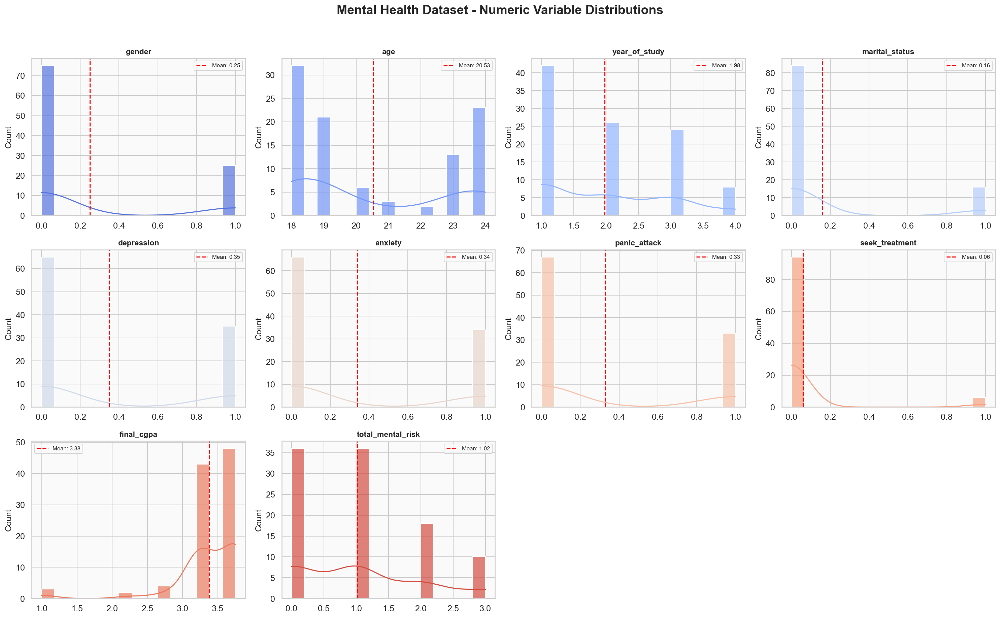

In [7]:
# ─── Mental Health Dataset Histograms ───
exclude_cols = ['student_id', 'source', 'is_female', 'is_male', 'is_other']
mental_numeric = [c for c in mental_df.select_dtypes(include=[np.number]).columns if c not in exclude_cols]

n_cols = 4
n_rows = max(1, (len(mental_numeric) + n_cols - 1) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
if n_rows == 1:
    axes = axes.reshape(1, -1)
fig.suptitle('Mental Health Dataset - Numeric Variable Distributions',
             fontsize=18, fontweight='bold', y=1.02)

colors = sns.color_palette("coolwarm", len(mental_numeric))

for i, col in enumerate(mental_numeric):
    ax = axes.flatten()[i]
    sns.histplot(mental_df[col], kde=True, ax=ax, color=colors[i],
                 edgecolor='white', alpha=0.7, bins=15)
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_xlabel('')
    mean_val = mental_df[col].mean()
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.5,
               label=f'Mean: {mean_val:.2f}')
    ax.legend(fontsize=8)

for j in range(i + 1, n_rows * n_cols):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'histogram_mental.png')
plt.show()

## 3. Correlation Heatmaps

We visualize linear relationships between variables using **Pearson correlation coefficients**.  
The upper triangle is masked to hide redundant information.

✅ Kaydedildi: ..\outputs\figures\correlation_matrix_student.png


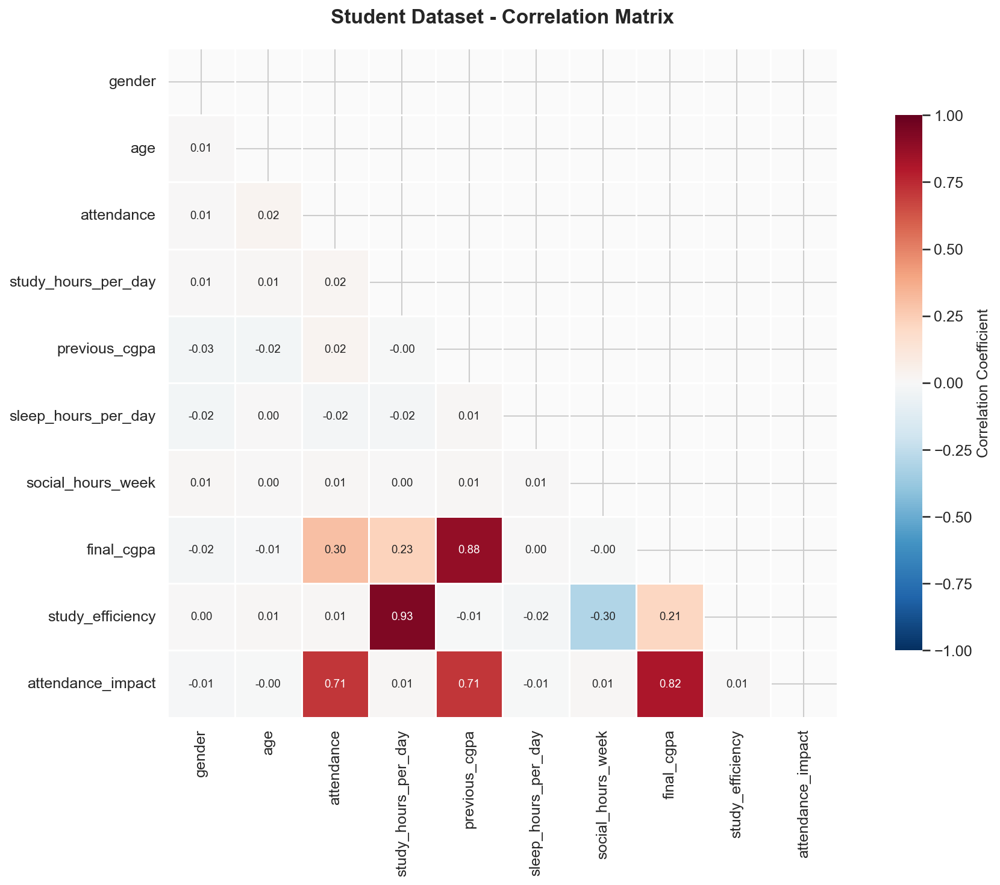

In [8]:
# ─── Student Correlation Matrix ───
exclude_cols = ['student_id', 'source', 'is_female', 'is_male', 'is_other']
student_corr_df = student_df.select_dtypes(include=[np.number]).drop(
    columns=[c for c in exclude_cols if c in student_df.columns], errors='ignore')

fig, ax = plt.subplots(figsize=(14, 10))
corr_student = student_corr_df.corr()
mask = np.triu(np.ones_like(corr_student, dtype=bool))
sns.heatmap(corr_student, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, square=True, linewidths=0.5, ax=ax,
            annot_kws={'size': 9}, vmin=-1, vmax=1,
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'})
ax.set_title('Student Dataset - Correlation Matrix', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
save_fig(fig, 'correlation_matrix_student.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\correlation_matrix_gaming.png


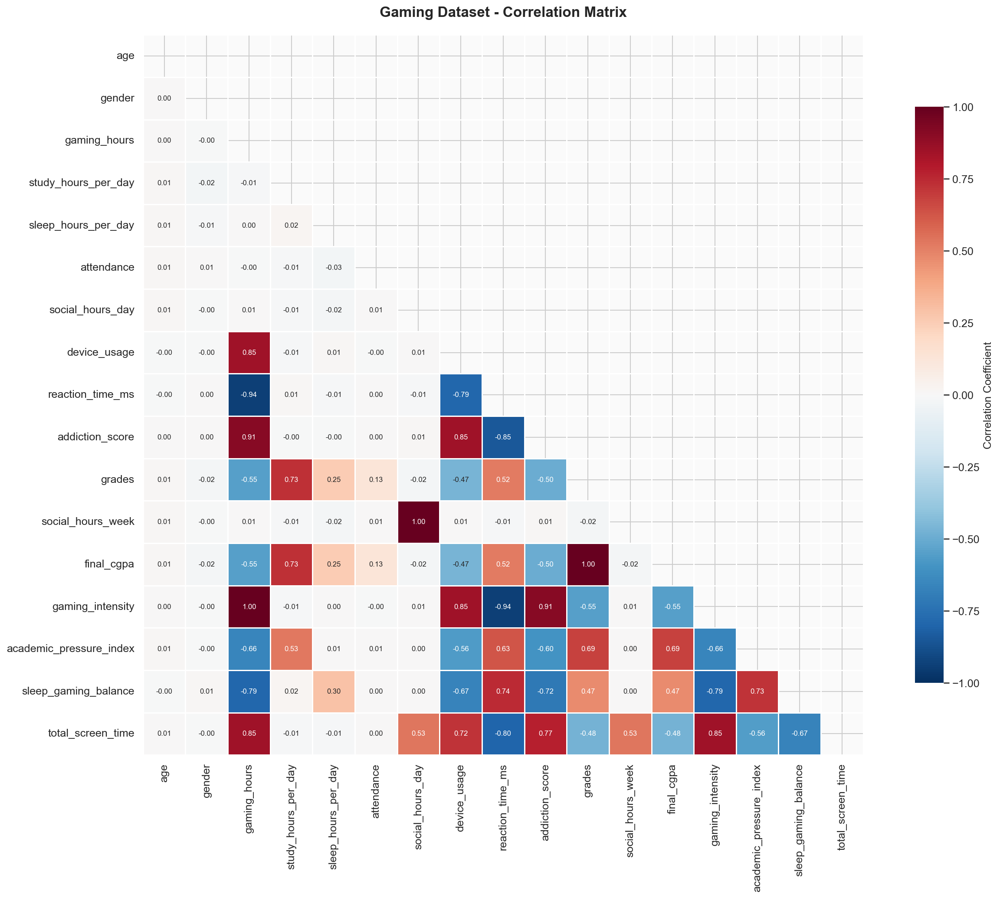

In [9]:
# ─── Gaming Correlation Matrix ───
gaming_corr_df = gaming_df.select_dtypes(include=[np.number]).drop(
    columns=[c for c in exclude_cols if c in gaming_df.columns], errors='ignore')

fig, ax = plt.subplots(figsize=(18, 14))
corr_gaming = gaming_corr_df.corr()
mask = np.triu(np.ones_like(corr_gaming, dtype=bool))
sns.heatmap(corr_gaming, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, square=True, linewidths=0.5, ax=ax,
            annot_kws={'size': 8}, vmin=-1, vmax=1,
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'})
ax.set_title('Gaming Dataset - Correlation Matrix', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
save_fig(fig, 'correlation_matrix_gaming.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\correlation_matrix_mental.png


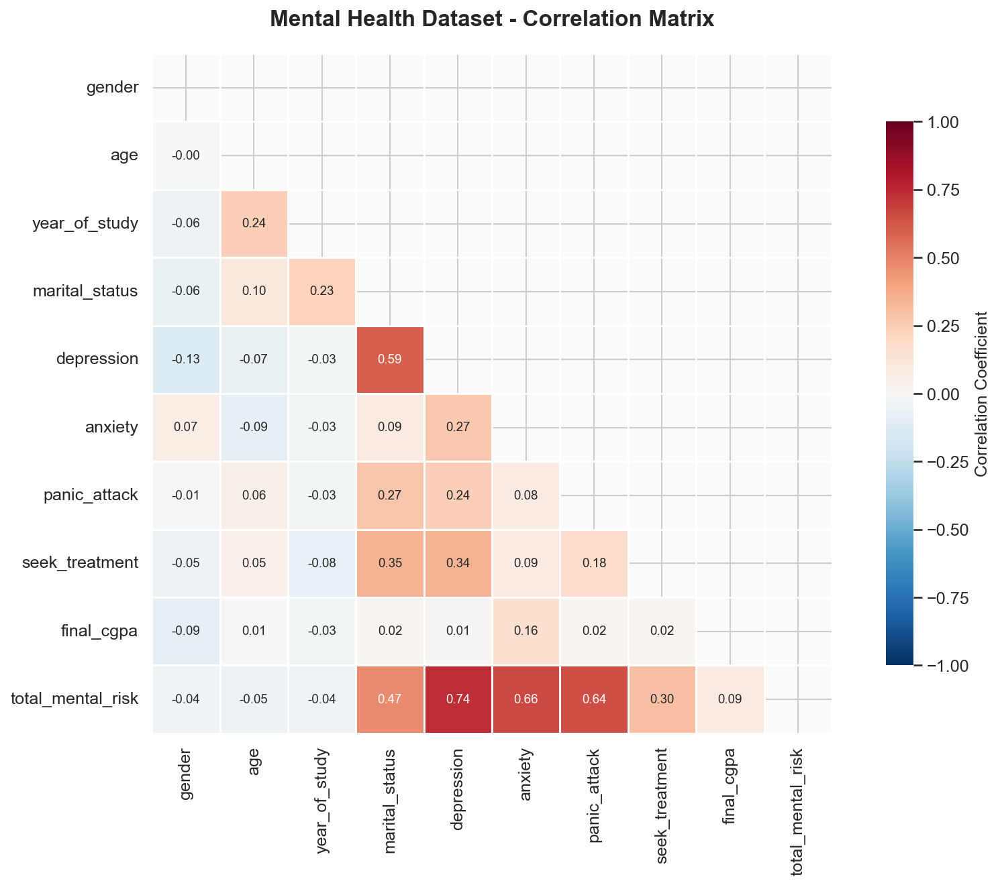

In [10]:
# ─── Mental Correlation Matrix ───
mental_corr_df = mental_df.select_dtypes(include=[np.number]).drop(
    columns=[c for c in exclude_cols if c in mental_df.columns], errors='ignore')

fig, ax = plt.subplots(figsize=(12, 9))
corr_mental = mental_corr_df.corr()
mask = np.triu(np.ones_like(corr_mental, dtype=bool))
sns.heatmap(corr_mental, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, square=True, linewidths=0.5, ax=ax,
            annot_kws={'size': 9}, vmin=-1, vmax=1,
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'})
ax.set_title('Mental Health Dataset - Correlation Matrix', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
save_fig(fig, 'correlation_matrix_mental.png')
plt.show()

## 4. Boxplots

We use **boxplots** to detect outliers and observe the distribution spread of variables.  
Red dots represent outliers.

✅ Kaydedildi: ..\outputs\figures\boxplot_student.png


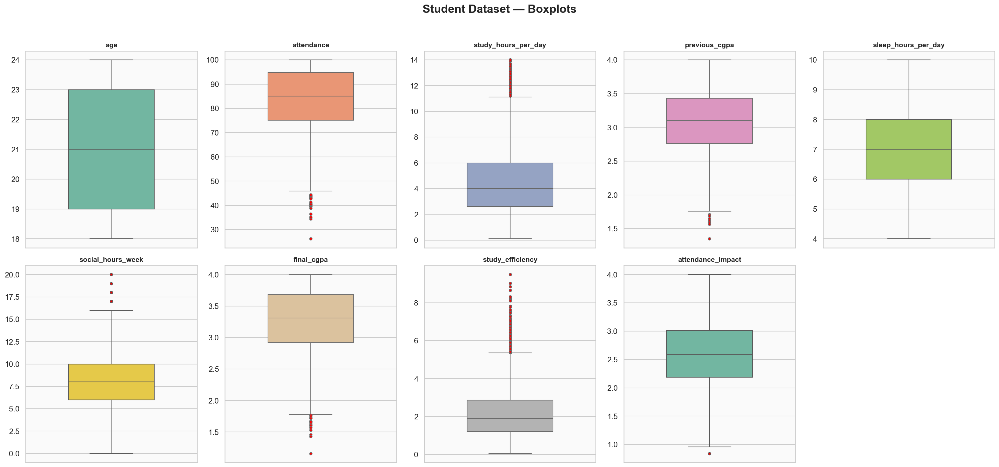

In [11]:
# ─── Student Boxplots ───
student_box_cols = ['age', 'attendance', 'study_hours_per_day', 'previous_cgpa',
                    'sleep_hours_per_day', 'social_hours_week', 'final_cgpa',
                    'study_efficiency', 'attendance_impact']
student_box_cols = [c for c in student_box_cols if c in student_df.columns]

n_box = len(student_box_cols)
n_cols_b = min(5, n_box)
n_rows_b = (n_box + n_cols_b - 1) // n_cols_b

fig, axes = plt.subplots(n_rows_b, n_cols_b, figsize=(22, n_rows_b * 5))
fig.suptitle('Student Dataset — Boxplots', fontsize=18, fontweight='bold', y=1.02)
colors = sns.color_palette("Set2", n_box)

for i, col in enumerate(student_box_cols):
    ax = axes.flatten()[i]
    sns.boxplot(y=student_df[col], ax=ax, color=colors[i], width=0.5,
                flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 4})
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_ylabel('')

for j in range(n_box, n_rows_b * n_cols_b):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'boxplot_student.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\boxplot_gaming.png


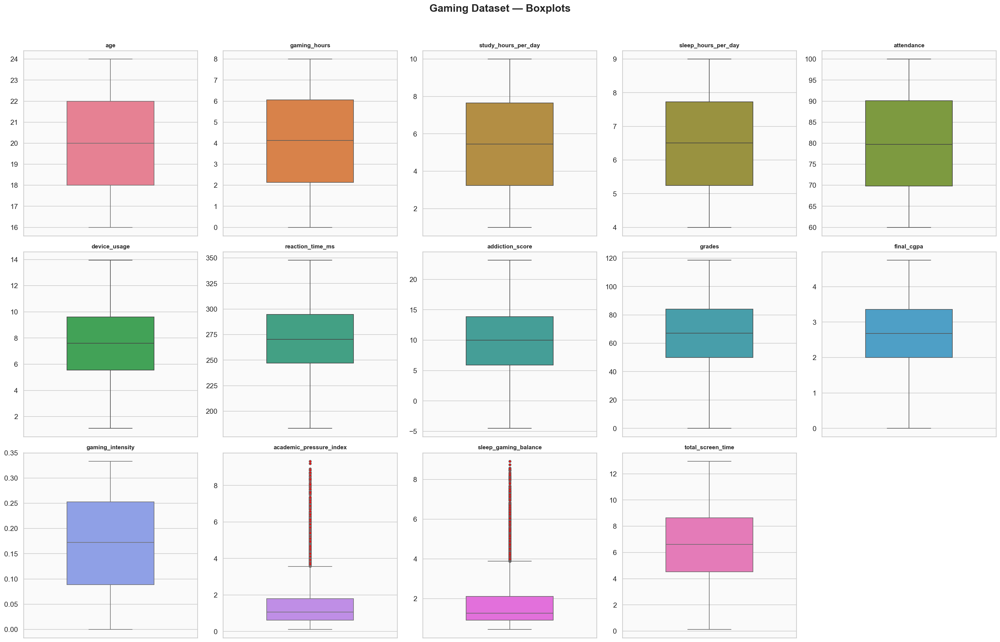

In [12]:
# ─── Gaming Boxplots ───
gaming_box_cols = ['age', 'gaming_hours', 'study_hours_per_day', 'sleep_hours_per_day',
                   'attendance', 'device_usage', 'reaction_time_ms', 'addiction_score',
                   'grades', 'final_cgpa', 'gaming_intensity', 'academic_pressure_index',
                   'sleep_gaming_balance', 'total_screen_time']
gaming_box_cols = [c for c in gaming_box_cols if c in gaming_df.columns]

n_box = len(gaming_box_cols)
n_cols_b = 5
n_rows_b = (n_box + n_cols_b - 1) // n_cols_b

fig, axes = plt.subplots(n_rows_b, n_cols_b, figsize=(24, n_rows_b * 5))
fig.suptitle('Gaming Dataset — Boxplots', fontsize=18, fontweight='bold', y=1.02)
colors = sns.color_palette("husl", n_box)

for i, col in enumerate(gaming_box_cols):
    ax = axes.flatten()[i]
    sns.boxplot(y=gaming_df[col], ax=ax, color=colors[i], width=0.5,
                flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 4})
    ax.set_title(col, fontsize=10, fontweight='bold')
    ax.set_ylabel('')

for j in range(n_box, n_rows_b * n_cols_b):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'boxplot_gaming.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\boxplot_mental.png


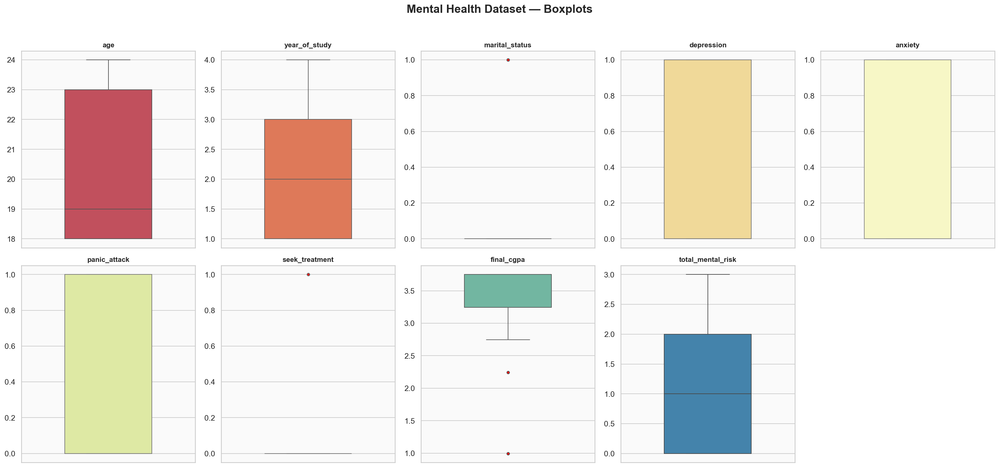

In [13]:
# ─── Mental Boxplots ───
mental_box_cols = ['age', 'year_of_study', 'marital_status', 'depression', 'anxiety',
                   'panic_attack', 'seek_treatment', 'final_cgpa', 'total_mental_risk']
mental_box_cols = [c for c in mental_box_cols if c in mental_df.columns]

n_box = len(mental_box_cols)
n_cols_b = min(5, n_box)
n_rows_b = max(1, (n_box + n_cols_b - 1) // n_cols_b)

fig, axes = plt.subplots(n_rows_b, n_cols_b, figsize=(22, n_rows_b * 5))
if n_rows_b == 1:
    axes = np.array(axes).reshape(1, -1)
fig.suptitle('Mental Health Dataset — Boxplots', fontsize=18, fontweight='bold', y=1.02)
colors = sns.color_palette("Spectral", n_box)

for i, col in enumerate(mental_box_cols):
    ax = axes.flatten()[i]
    sns.boxplot(y=mental_df[col], ax=ax, color=colors[i], width=0.5,
                flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 4})
    ax.set_title(col, fontsize=11, fontweight='bold')
    ax.set_ylabel('')

for j in range(n_box, n_rows_b * n_cols_b):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'boxplot_mental.png')
plt.show()

## 5. Scatterplots

Relationships between the target variable **final_cgpa** and the most important independent variables  
are analyzed using **scatterplots with regression lines**.  
The Pearson correlation coefficient (r) is shown on each plot.

✅ Kaydedildi: ..\outputs\figures\scatterplot_student_cgpa.png


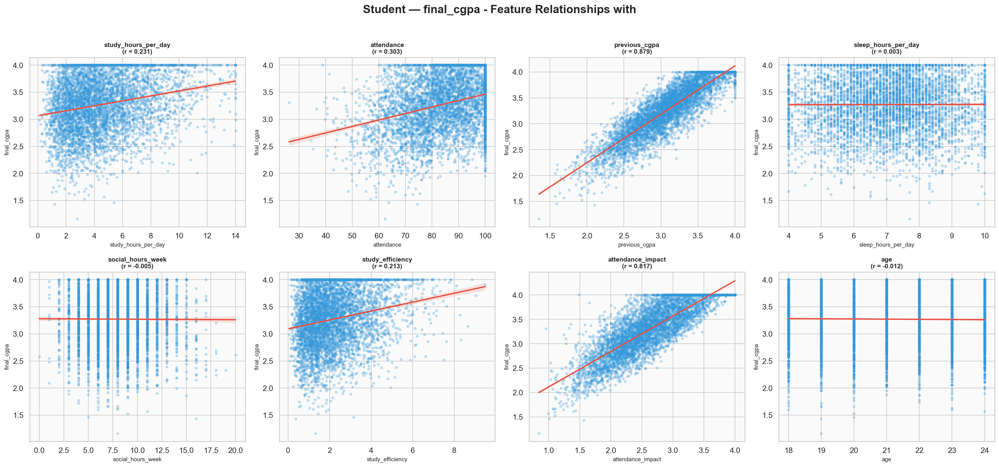

In [14]:
# ─── Student: Variables Related to final_cgpa ───
scatter_student = [
    ('study_hours_per_day', 'final_cgpa'),
    ('attendance', 'final_cgpa'),
    ('previous_cgpa', 'final_cgpa'),
    ('sleep_hours_per_day', 'final_cgpa'),
    ('social_hours_week', 'final_cgpa'),
    ('study_efficiency', 'final_cgpa'),
    ('attendance_impact', 'final_cgpa'),
    ('age', 'final_cgpa'),
]
scatter_student = [(x, y) for x, y in scatter_student
                   if x in student_df.columns and y in student_df.columns]

n_plots = len(scatter_student)
n_c = 4
n_r = (n_plots + n_c - 1) // n_c

fig, axes = plt.subplots(n_r, n_c, figsize=(22, n_r * 5))
fig.suptitle('Student — final_cgpa - Feature Relationships with',
             fontsize=18, fontweight='bold', y=1.02)

for i, (x_col, y_col) in enumerate(scatter_student):
    ax = axes.flatten()[i]
    sns.regplot(x=student_df[x_col], y=student_df[y_col], ax=ax,
                scatter_kws={'alpha': 0.25, 's': 12, 'color': '#3498db'},
                line_kws={'color': '#e74c3c', 'linewidth': 2})
    corr_val = student_df[[x_col, y_col]].corr().iloc[0, 1]
    ax.set_title(f'{x_col}\n(r = {corr_val:.3f})', fontsize=10, fontweight='bold')
    ax.set_xlabel(x_col, fontsize=9)
    ax.set_ylabel(y_col, fontsize=9)

for j in range(n_plots, n_r * n_c):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'scatterplot_student_cgpa.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\scatterplot_gaming_cgpa.png


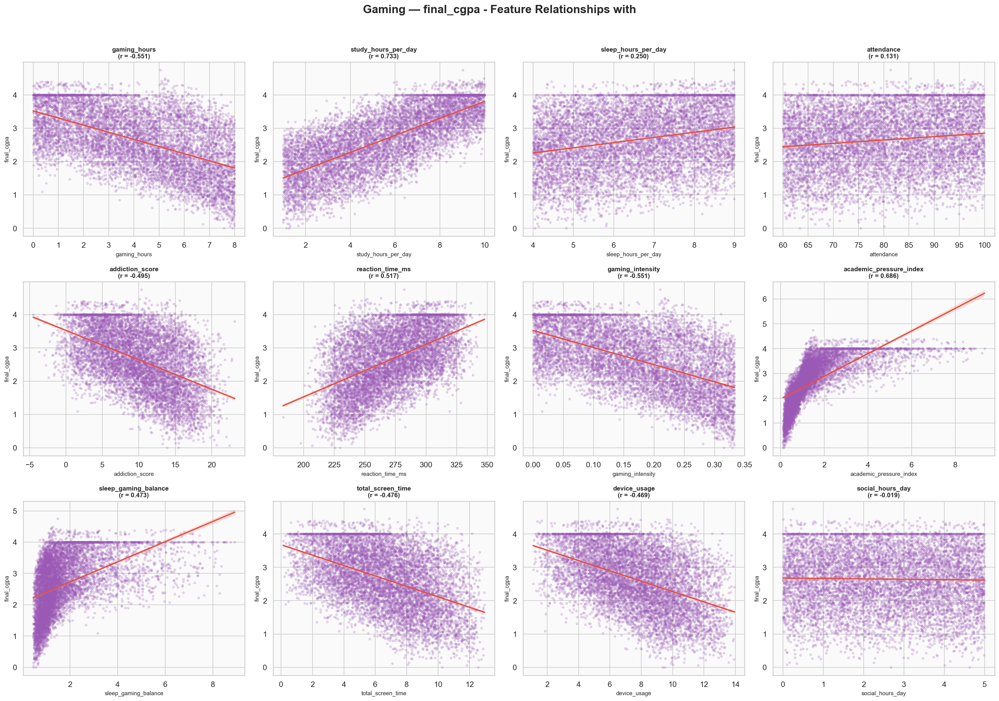

In [15]:
# ─── Gaming: Variables Related to final_cgpa ───
scatter_gaming = [
    ('gaming_hours', 'final_cgpa'),
    ('study_hours_per_day', 'final_cgpa'),
    ('sleep_hours_per_day', 'final_cgpa'),
    ('attendance', 'final_cgpa'),
    ('addiction_score', 'final_cgpa'),
    ('reaction_time_ms', 'final_cgpa'),
    ('gaming_intensity', 'final_cgpa'),
    ('academic_pressure_index', 'final_cgpa'),
    ('sleep_gaming_balance', 'final_cgpa'),
    ('total_screen_time', 'final_cgpa'),
    ('device_usage', 'final_cgpa'),
    ('social_hours_day', 'final_cgpa'),
]
scatter_gaming = [(x, y) for x, y in scatter_gaming
                  if x in gaming_df.columns and y in gaming_df.columns]

n_plots = len(scatter_gaming)
n_c = 4
n_r = (n_plots + n_c - 1) // n_c

fig, axes = plt.subplots(n_r, n_c, figsize=(22, n_r * 5))
fig.suptitle('Gaming — final_cgpa - Feature Relationships with',
             fontsize=18, fontweight='bold', y=1.02)

for i, (x_col, y_col) in enumerate(scatter_gaming):
    ax = axes.flatten()[i]
    sns.regplot(x=gaming_df[x_col], y=gaming_df[y_col], ax=ax,
                scatter_kws={'alpha': 0.2, 's': 10, 'color': '#9b59b6'},
                line_kws={'color': '#e74c3c', 'linewidth': 2})
    corr_val = gaming_df[[x_col, y_col]].corr().iloc[0, 1]
    ax.set_title(f'{x_col}\n(r = {corr_val:.3f})', fontsize=10, fontweight='bold')
    ax.set_xlabel(x_col, fontsize=9)
    ax.set_ylabel(y_col, fontsize=9)

for j in range(n_plots, n_r * n_c):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'scatterplot_gaming_cgpa.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\scatterplot_mental_cgpa.png


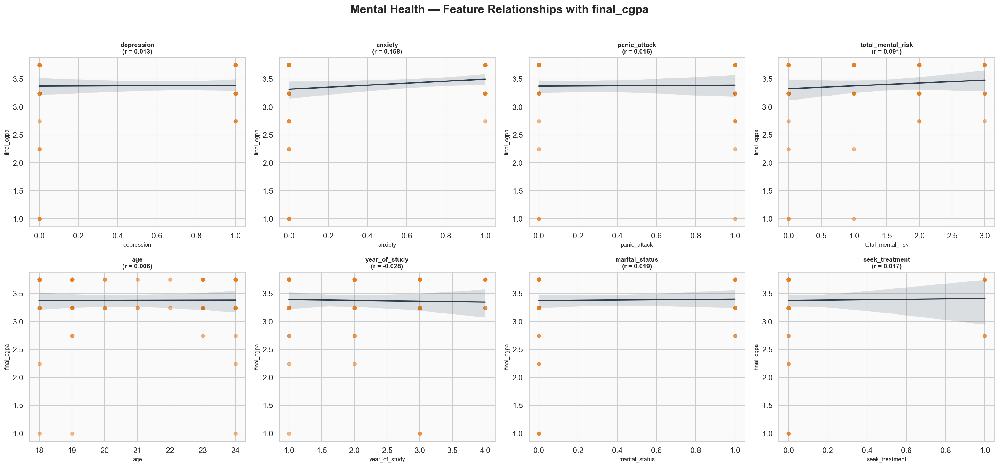

In [16]:
# ─── Mental: Variables Related to final_cgpa ───
scatter_mental = [
    ('depression', 'final_cgpa'),
    ('anxiety', 'final_cgpa'),
    ('panic_attack', 'final_cgpa'),
    ('total_mental_risk', 'final_cgpa'),
    ('age', 'final_cgpa'),
    ('year_of_study', 'final_cgpa'),
    ('marital_status', 'final_cgpa'),
    ('seek_treatment', 'final_cgpa'),
]
scatter_mental = [(x, y) for x, y in scatter_mental
                  if x in mental_df.columns and y in mental_df.columns]

n_plots = len(scatter_mental)
n_c = 4
n_r = max(1, (n_plots + n_c - 1) // n_c)

fig, axes = plt.subplots(n_r, n_c, figsize=(22, n_r * 5))
if n_r == 1:
    axes = np.array(axes).reshape(1, -1)
fig.suptitle('Mental Health — Feature Relationships with final_cgpa',
             fontsize=18, fontweight='bold', y=1.02)

for i, (x_col, y_col) in enumerate(scatter_mental):
    ax = axes.flatten()[i]
    sns.regplot(x=mental_df[x_col], y=mental_df[y_col], ax=ax,
                scatter_kws={'alpha': 0.5, 's': 30, 'color': '#e67e22'},
                line_kws={'color': '#2c3e50', 'linewidth': 2})
    corr_val = mental_df[[x_col, y_col]].corr().iloc[0, 1]
    ax.set_title(f'{x_col}\n(r = {corr_val:.3f})', fontsize=10, fontweight='bold')
    ax.set_xlabel(x_col, fontsize=9)
    ax.set_ylabel(y_col, fontsize=9)

for j in range(n_plots, n_r * n_c):
    axes.flatten()[j].set_visible(False)

plt.tight_layout()
save_fig(fig, 'scatterplot_mental_cgpa.png')
plt.show()

## 6. Pairplot Analysis

We analyze the **pairwise relationships** between selected variables for each dataset.  
KDE (Kernel Density Estimation) distributions are shown on the diagonal.

> **Note:** Due to the large number of variables, the most important variables were selected to create the pairplot.

✅ Kaydedildi: ..\outputs\figures\pairplot_student.png


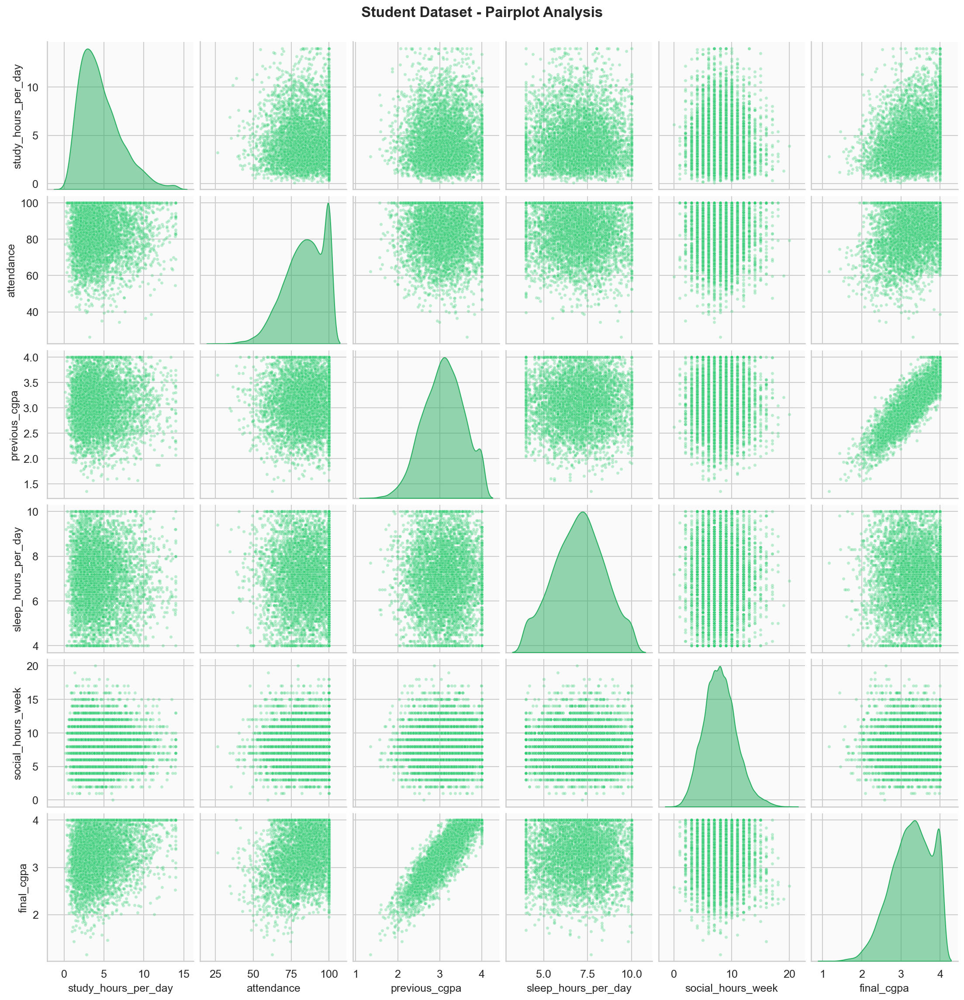

In [17]:
# ─── Student Pairplot ───
student_pair_cols = ['study_hours_per_day', 'attendance', 'previous_cgpa',
                     'sleep_hours_per_day', 'social_hours_week', 'final_cgpa']
student_pair_cols = [c for c in student_pair_cols if c in student_df.columns]

g = sns.pairplot(student_df[student_pair_cols], diag_kind='kde',
                 plot_kws={'alpha': 0.3, 's': 12, 'color': '#2ecc71'},
                 diag_kws={'color': '#27ae60', 'fill': True, 'alpha': 0.5})
g.figure.suptitle('Student Dataset - Pairplot Analysis',
                  fontsize=16, fontweight='bold', y=1.02)
save_fig(g.figure, 'pairplot_student.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\pairplot_gaming.png


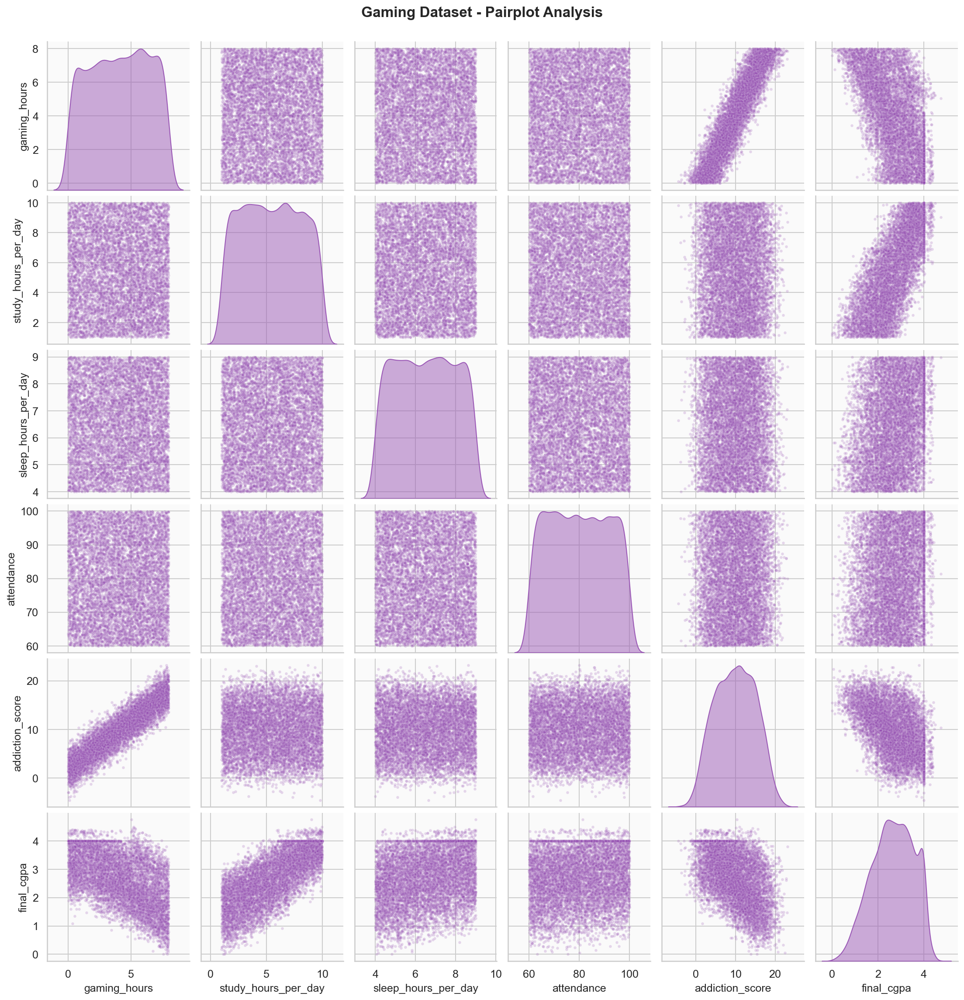

In [18]:
# ─── Gaming Pairplot ───
gaming_pair_cols = ['gaming_hours', 'study_hours_per_day', 'sleep_hours_per_day',
                    'attendance', 'addiction_score', 'final_cgpa']
gaming_pair_cols = [c for c in gaming_pair_cols if c in gaming_df.columns]

g = sns.pairplot(gaming_df[gaming_pair_cols], diag_kind='kde',
                 plot_kws={'alpha': 0.2, 's': 10, 'color': '#8e44ad'},
                 diag_kws={'color': '#9b59b6', 'fill': True, 'alpha': 0.5})
g.figure.suptitle('Gaming Dataset - Pairplot Analysis',
                  fontsize=16, fontweight='bold', y=1.02)
save_fig(g.figure, 'pairplot_gaming.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\pairplot_mental.png


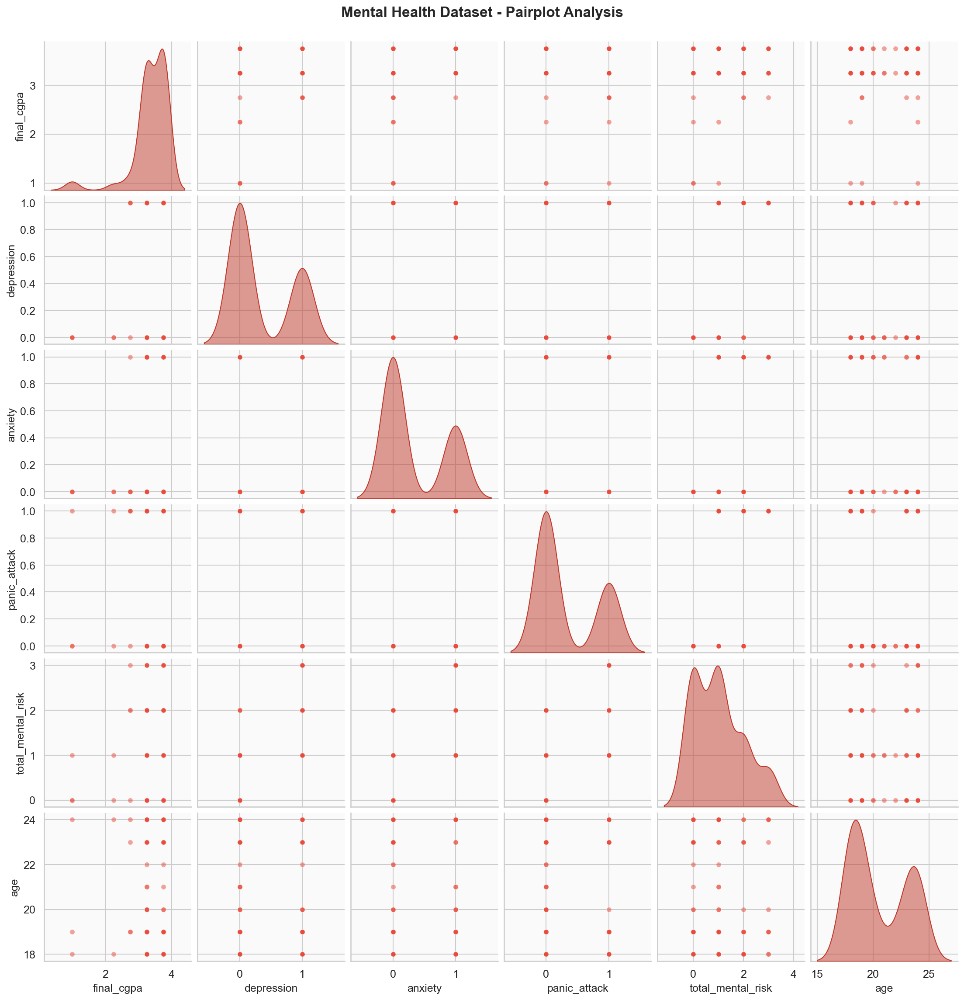

In [19]:
# ─── Mental Pairplot ───
mental_pair_cols = ['final_cgpa', 'depression', 'anxiety', 'panic_attack',
                    'total_mental_risk', 'age']
mental_pair_cols = [c for c in mental_pair_cols if c in mental_df.columns]

g = sns.pairplot(mental_df[mental_pair_cols], diag_kind='kde',
                 plot_kws={'alpha': 0.5, 's': 30, 'color': '#e74c3c'},
                 diag_kws={'color': '#c0392b', 'fill': True, 'alpha': 0.5})
g.figure.suptitle('Mental Health Dataset - Pairplot Analysis',
                  fontsize=16, fontweight='bold', y=1.02)
save_fig(g.figure, 'pairplot_mental.png')
plt.show()

## 7. Categorical Boxplots

We analyze the distribution of target variables (final_cgpa) according to categorical variables.

✅ Kaydedildi: ..\outputs\figures\boxplot_gaming_categorical_vs_cgpa.png


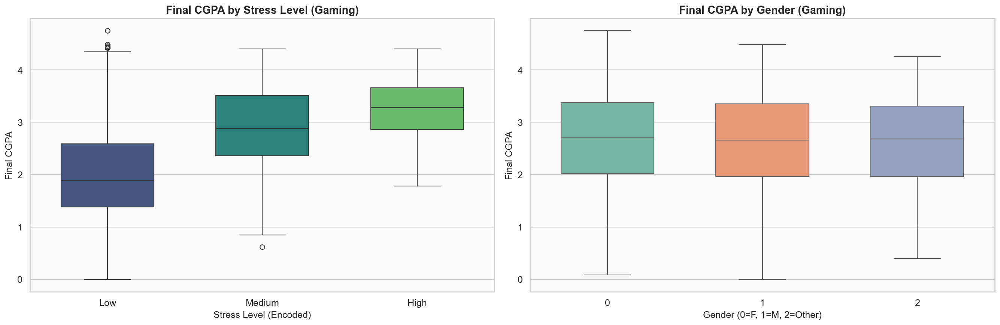

In [20]:
# ─── Gaming: Stress Level vs final_cgpa ───
if 'stress_level' in gaming_df.columns:
    # stress_level is label-encoded (Low/Medium/High as strings or ints)
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    sns.boxplot(x='stress_level', y='final_cgpa', data=gaming_df, ax=axes[0],
                palette='viridis', width=0.6)
    axes[0].set_title('Final CGPA by Stress Level (Gaming)',
                      fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Stress Level (Encoded)', fontsize=12)
    axes[0].set_ylabel('Final CGPA', fontsize=12)

    if 'gender' in gaming_df.columns:
        sns.boxplot(x='gender', y='final_cgpa', data=gaming_df, ax=axes[1],
                    palette='Set2', width=0.6)
        axes[1].set_title('Final CGPA by Gender (Gaming)',
                          fontsize=14, fontweight='bold')
        axes[1].set_xlabel('Gender (0=F, 1=M, 2=Other)', fontsize=12)
        axes[1].set_ylabel('Final CGPA', fontsize=12)

    plt.tight_layout()
    save_fig(fig, 'boxplot_gaming_categorical_vs_cgpa.png')
    plt.show()

✅ Kaydedildi: ..\outputs\figures\boxplot_student_categorical_vs_cgpa.png


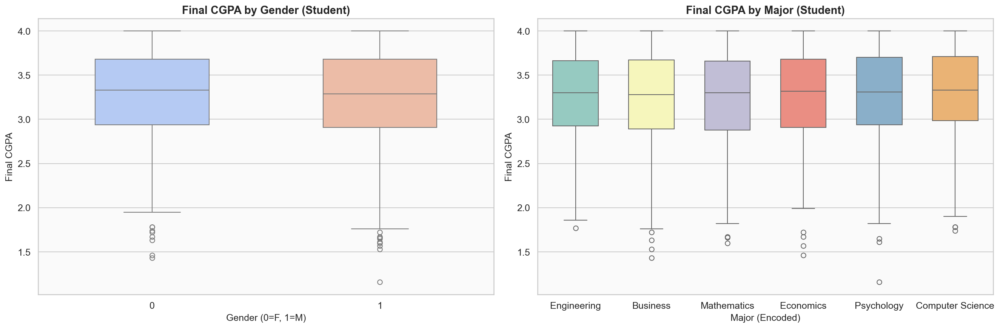

In [21]:
# ─── Student: Gender & Major vs final_cgpa ───
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

if 'gender' in student_df.columns:
    sns.boxplot(x='gender', y='final_cgpa', data=student_df, ax=axes[0],
                palette='coolwarm', width=0.5)
    axes[0].set_title('Final CGPA by Gender (Student)',
                      fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Gender (0=F, 1=M)', fontsize=12)
    axes[0].set_ylabel('Final CGPA', fontsize=12)

if 'major' in student_df.columns:
    sns.boxplot(x='major', y='final_cgpa', data=student_df, ax=axes[1],
                palette='Set3', width=0.6)
    axes[1].set_title('Final CGPA by Major (Student)',
                      fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Major (Encoded)', fontsize=12)
    axes[1].set_ylabel('Final CGPA', fontsize=12)

plt.tight_layout()
save_fig(fig, 'boxplot_student_categorical_vs_cgpa.png')
plt.show()

✅ Kaydedildi: ..\outputs\figures\boxplot_mental_categorical_vs_cgpa.png


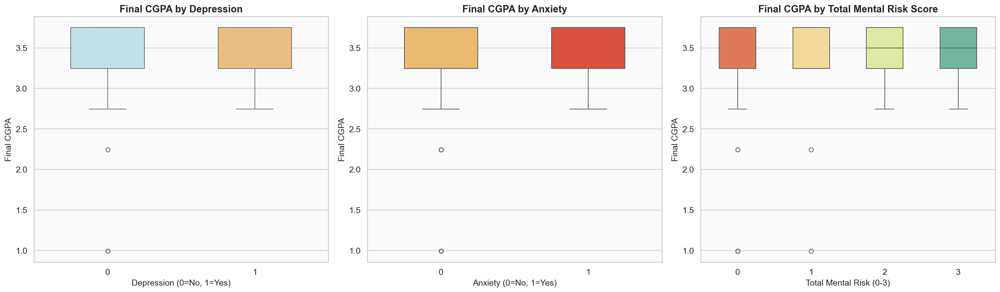

In [22]:
# ─── Mental: Depression & Anxiety vs final_cgpa ───
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

if 'depression' in mental_df.columns:
    sns.boxplot(x='depression', y='final_cgpa', data=mental_df, ax=axes[0],
                palette='RdYlBu_r', width=0.5)
    axes[0].set_title('Final CGPA by Depression', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Depression (0=No, 1=Yes)', fontsize=12)
    axes[0].set_ylabel('Final CGPA', fontsize=12)

if 'anxiety' in mental_df.columns:
    sns.boxplot(x='anxiety', y='final_cgpa', data=mental_df, ax=axes[1],
                palette='YlOrRd', width=0.5)
    axes[1].set_title('Final CGPA by Anxiety', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Anxiety (0=No, 1=Yes)', fontsize=12)
    axes[1].set_ylabel('Final CGPA', fontsize=12)

if 'total_mental_risk' in mental_df.columns:
    sns.boxplot(x='total_mental_risk', y='final_cgpa', data=mental_df, ax=axes[2],
                palette='Spectral', width=0.5)
    axes[2].set_title('Final CGPA by Total Mental Risk Score', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Total Mental Risk (0-3)', fontsize=12)
    axes[2].set_ylabel('Final CGPA', fontsize=12)

plt.tight_layout()
save_fig(fig, 'boxplot_mental_categorical_vs_cgpa.png')
plt.show()

## 8. Correlation Summaries — Strongest Relationships

We list the variables with the strongest correlation with **final_cgpa** in each dataset.

In [23]:
def top_correlations(df, target, name, exclude=['student_id', 'source', 'is_female', 'is_male', 'is_other'], n=15):
    """List variables with the strongest correlation to the target variable."""
    numeric_df = df.select_dtypes(include=[np.number])
    numeric_df = numeric_df.drop(columns=[c for c in exclude if c in numeric_df.columns], errors='ignore')
    
    if target not in numeric_df.columns:
        print(f"⚠️ {target} column not found.")
        return None
    
    corr = numeric_df.corr()[target].drop(target)
    corr_abs = corr.abs().sort_values(ascending=False)
    
    print(f"\n{'='*65}")
    print(f"🔗 {name} — {target} — Strongest Correlations with")
    print(f"{'='*65}")
    
    for col in corr_abs.head(n).index:
        val = corr[col]
        arrow = "↑ Pozitif" if val > 0 else "↓ Negatif"
        bar = "█" * int(abs(val) * 30)
        print(f"  {col:<35} r = {val:+.4f}  {arrow}  {bar}")
    
    return corr

corr_student = top_correlations(student_df, 'final_cgpa', 'Student')
corr_gaming  = top_correlations(gaming_df,  'final_cgpa', 'Gaming')
corr_mental  = top_correlations(mental_df,  'final_cgpa', 'Mental')


🔗 Student — final_cgpa — Strongest Correlations with
  previous_cgpa                       r = +0.8789  ↑ Pozitif  ██████████████████████████
  attendance_impact                   r = +0.8173  ↑ Pozitif  ████████████████████████
  attendance                          r = +0.3028  ↑ Pozitif  █████████
  study_hours_per_day                 r = +0.2309  ↑ Pozitif  ██████
  study_efficiency                    r = +0.2132  ↑ Pozitif  ██████
  gender                              r = -0.0166  ↓ Negatif  
  age                                 r = -0.0122  ↓ Negatif  
  social_hours_week                   r = -0.0049  ↓ Negatif  
  sleep_hours_per_day                 r = +0.0026  ↑ Pozitif  

🔗 Gaming — final_cgpa — Strongest Correlations with
  grades                              r = +1.0000  ↑ Pozitif  █████████████████████████████
  study_hours_per_day                 r = +0.7332  ↑ Pozitif  █████████████████████
  academic_pressure_index             r = +0.6855  ↑ Pozitif  █████████████████

## 9. Summary Visualization — Target Variable Correlation Comparison

✅ Kaydedildi: ..\outputs\figures\summary_target_correlations.png


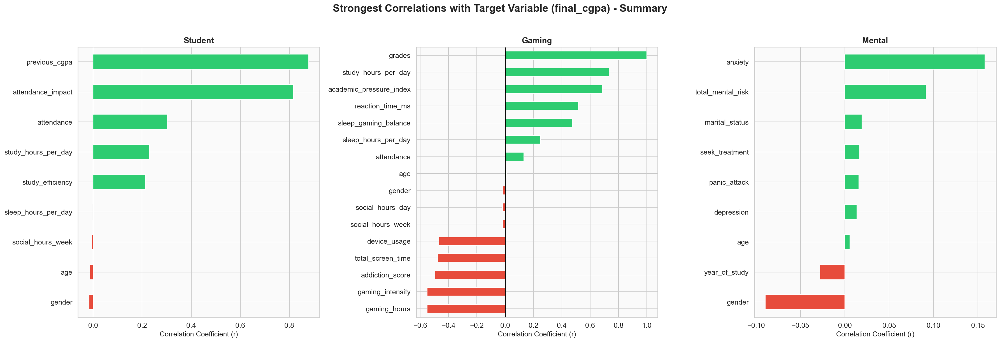

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
fig.suptitle('Strongest Correlations with Target Variable (final_cgpa) - Summary',
             fontsize=18, fontweight='bold', y=1.02)

exclude = ['student_id', 'source', 'is_female', 'is_male', 'is_other']

# ── Student ──
ax = axes[0]
s_corr = student_df.select_dtypes(include=[np.number]).drop(
    columns=[c for c in exclude if c in student_df.columns], errors='ignore'
).corr()['final_cgpa'].drop('final_cgpa').sort_values()
colors_s = ['#e74c3c' if v < 0 else '#2ecc71' for v in s_corr.values]
s_corr.plot(kind='barh', ax=ax, color=colors_s, edgecolor='white')
ax.set_title('Student', fontsize=14, fontweight='bold')
ax.set_xlabel('Correlation Coefficient (r)')
ax.axvline(0, color='black', linewidth=0.5)

# ── Gaming ──
ax = axes[1]
g_corr = gaming_df.select_dtypes(include=[np.number]).drop(
    columns=[c for c in exclude if c in gaming_df.columns], errors='ignore'
).corr()['final_cgpa'].drop('final_cgpa').sort_values()
colors_g = ['#e74c3c' if v < 0 else '#2ecc71' for v in g_corr.values]
g_corr.plot(kind='barh', ax=ax, color=colors_g, edgecolor='white')
ax.set_title('Gaming', fontsize=14, fontweight='bold')
ax.set_xlabel('Correlation Coefficient (r)')
ax.axvline(0, color='black', linewidth=0.5)

# ── Mental ──
ax = axes[2]
m_corr = mental_df.select_dtypes(include=[np.number]).drop(
    columns=[c for c in exclude if c in mental_df.columns], errors='ignore'
).corr()['final_cgpa'].drop('final_cgpa').sort_values()
colors_m = ['#e74c3c' if v < 0 else '#2ecc71' for v in m_corr.values]
m_corr.plot(kind='barh', ax=ax, color=colors_m, edgecolor='white')
ax.set_title('Mental', fontsize=14, fontweight='bold')
ax.set_xlabel('Correlation Coefficient (r)')
ax.axvline(0, color='black', linewidth=0.5)

plt.tight_layout()
save_fig(fig, 'summary_target_correlations.png')
plt.show()

## 10. 📝 Key Findings and Important Data Relationships

---

### 🎯 Finding 1: Study Hours and Attendance → CGPA (Student)
- The **study_hours_per_day** and **attendance** variables have the strongest **positive correlation** with the student's `final_cgpa`.
- **previous_cgpa** also shows a strong positive relationship with final_cgpa — this reveals that previous academic success is a strong predictor of future performance.
- **attendance_impact** (attendance × previous CGPA) carries a strong signal as an engineered feature.

### 🎮 Finding 2: Gaming Addiction Score and Gaming Duration → CGPA (Gaming)
- The **addiction_score** and **gaming_hours** variables show a **negative correlation** with `final_cgpa`.
- **study_hours_per_day** and **attendance** are positively correlated.
- The **academic_pressure_index** (study/gaming ratio) and **sleep_gaming_balance** engineered features capture the impact of gaming habits on academic performance.

### 🧠 Finding 3: Depression and Mental Risk → CGPA (Mental)
- **depression**, **anxiety**, and the total **total_mental_risk** score have a **negative correlation** with `final_cgpa`.
- As mental health problems increase, academic performance tends to decrease.
- Due to the small dataset (101 observations), these results should be interpreted with caution.

### 📊 Finding 4: Social Activity and Sleep Balance
- In the **Student** dataset, as **social_hours_week** increases, CGPA tends to decrease.
- In the **Gaming** dataset, students with a high **sleep_gaming_balance** (sleep/gaming ratio) exhibited better academic performance.
- This confirms the important link between a healthy lifestyle balance and academic success.

---

> ⚠️ **Note:** The above findings are observations based on correlation analysis. Additional experimental studies are required for causation.